In [1]:
#import necessary packages
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

In [2]:
#Load Dataset
data = pd.read_csv('genres_v2.csv')
data.head()


C:\Users\HP\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3057: DtypeWarning: Columns (19) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,song_name,Unnamed: 0,title
0,0.831,0.814,2,-7.364,1,0.4200,0.0598,0.013400,0.0556,0.3890,...,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Mercury: Retrograde,NaN,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.4010,0.000000,0.1180,0.1240,...,7pgJBLVz5VmnL7uGHmRj6p,spotify:track:7pgJBLVz5VmnL7uGHmRj6p,https://api.spotify.com/v1/tracks/7pgJBLVz5Vmn...,https://api.spotify.com/v1/audio-analysis/7pgJ...,224427,4,Dark Trap,Pathology,NaN,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.0138,0.000004,0.3720,0.0391,...,0vSWgAlfpye0WCGeNmuNhy,spotify:track:0vSWgAlfpye0WCGeNmuNhy,https://api.spotify.com/v1/tracks/0vSWgAlfpye0...,https://api.spotify.com/v1/audio-analysis/0vSW...,98821,4,Dark Trap,Symbiote,NaN,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.0237,0.000000,0.1140,0.1750,...,0VSXnJqQkwuH2ei1nOQ1nu,spotify:track:0VSXnJqQkwuH2ei1nOQ1nu,https://api.spotify.com/v1/tracks/0VSXnJqQkwuH...,https://api.spotify.com/v1/audio-analysis/0VSX...,123661,3,Dark Trap,ProductOfDrugs (Prod. The Virus and Antidote),NaN,NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.2170,0.000000,0.1660,0.5910,...,4jCeguq9rMTlbMmPHuO7S3,spotify:track:4jCeguq9rMTlbMmPHuO7S3,https://api.spotify.com/v1/tracks/4jCeguq9rMTl...,https://api.spotify.com/v1/audio-analysis/4jCe...,123298,4,Dark Trap,Venom,NaN,NaN


In [62]:
data.tail(1562)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre
26682,0.6670,0.771,10,-10.397,0,0.0472,0.079500,0.928000,0.0964,0.0469,128.997,401860,4,12
26683,0.7910,0.861,10,-9.169,0,0.0550,0.005380,0.936000,0.0838,0.1000,125.988,428544,4,12
26684,0.6080,0.988,11,-8.238,0,0.0515,0.030900,0.841000,0.1750,0.2620,133.989,433104,4,12
26685,0.6140,0.874,6,-7.772,1,0.0901,0.001100,0.915000,0.4030,0.2550,128.993,334190,4,12
26686,0.6400,0.938,6,-7.527,0,0.0998,0.001340,0.756000,0.1430,0.1130,128.001,471563,4,12
26687,0.6560,0.937,0,-5.062,1,0.0615,0.000791,0.874000,0.0981,0.1810,127.999,382500,4,12
26688,0.6720,0.800,4,-9.649,1,0.0474,0.000158,0.865000,0.0605,0.2580,131.994,393312,4,12
26689,0.7620,0.823,11,-11.851,1,0.0465,0.005040,0.918000,0.0852,0.3120,132.004,366000,4,12
26690,0.8060,0.774,4,-8.915,1,0.0506,0.050700,0.899000,0.0899,0.0977,124.000,449274,4,12
26691,0.8310,0.789,6,-10.125,0,0.0584,0.003810,0.631000,0.0940,0.2840,124.998,405462,4,12


In [3]:
data.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'id', 'uri', 'track_href', 'analysis_url', 'duration_ms',
       'time_signature', 'genre', 'song_name', 'Unnamed: 0', 'title'],
      dtype='object')

In [4]:
data.iloc[0,:]

danceability                                                    0.831
energy                                                          0.814
key                                                                 2
loudness                                                       -7.364
mode                                                                1
speechiness                                                      0.42
acousticness                                                   0.0598
instrumentalness                                               0.0134
liveness                                                       0.0556
valence                                                         0.389
tempo                                                         156.985
type                                                   audio_features
id                                             2Vc6NJ9PW9gD9q343XFRKx
uri                              spotify:track:2Vc6NJ9PW9gD9q343XFRKx
track_href          

In [5]:
#droping unwanted columns 
data = data.drop(['title','Unnamed: 0','id','uri','track_href','analysis_url','type','song_name'],axis=1)
print(data.columns)
data.head()

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'time_signature', 'genre'],
      dtype='object')


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre
0,0.831,0.814,2,-7.364,1,0.4200,0.0598,0.013400,0.0556,0.3890,156.985,124539,4,Dark Trap
1,0.719,0.493,8,-7.230,1,0.0794,0.4010,0.000000,0.1180,0.1240,115.080,224427,4,Dark Trap
2,0.850,0.893,5,-4.783,1,0.0623,0.0138,0.000004,0.3720,0.0391,218.050,98821,4,Dark Trap
3,0.476,0.781,0,-4.710,1,0.1030,0.0237,0.000000,0.1140,0.1750,186.948,123661,3,Dark Trap
4,0.798,0.624,2,-7.668,1,0.2930,0.2170,0.000000,0.1660,0.5910,147.988,123298,4,Dark Trap


In [6]:
#checking for null values
data.isnull().sum()

danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
genre               0
dtype: int64

It is clear that there are no null values in the dataset

## Data Analysis

In [7]:
data.shape


(42305, 14)

So after removing the unwanted columns we are lef with 14 columns and 42305 rows

In [8]:
#identifying all the numeric columns
numeric = data._get_numeric_data()
genre = data['genre']
print(numeric.head())
print("Numeric columns: ",end=" ")
print(numeric.columns)
print(len(numeric.columns))


numeric.describe()

   danceability  energy  key  loudness  mode  speechiness  acousticness  \
0         0.831   0.814    2    -7.364     1       0.4200        0.0598   
1         0.719   0.493    8    -7.230     1       0.0794        0.4010   
2         0.850   0.893    5    -4.783     1       0.0623        0.0138   
3         0.476   0.781    0    -4.710     1       0.1030        0.0237   
4         0.798   0.624    2    -7.668     1       0.2930        0.2170   

   instrumentalness  liveness  valence    tempo  duration_ms  time_signature  
0          0.013400    0.0556   0.3890  156.985       124539               4  
1          0.000000    0.1180   0.1240  115.080       224427               4  
2          0.000004    0.3720   0.0391  218.050        98821               4  
3          0.000000    0.1140   0.1750  186.948       123661               3  
4          0.000000    0.1660   0.5910  147.988       123298               4  
Numeric columns:  Index(['danceability', 'energy', 'key', 'loudness', 'mode

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000,42305.000000
mean,0.639364,0.762516,5.370240,-6.465442,0.549462,0.136561,0.096160,0.283048,0.214079,0.357101,147.474056,250865.846685,3.972580
std,0.156617,0.183823,3.666145,2.941165,0.497553,0.126168,0.170827,0.370791,0.175576,0.233200,23.844623,102957.713571,0.268342
min,0.065100,0.000243,0.000000,-33.357000,0.000000,0.022700,0.000001,0.000000,0.010700,0.018700,57.967000,25600.000000,1.000000
25%,0.524000,0.632000,1.000000,-8.161000,0.000000,0.049100,0.001730,0.000000,0.099600,0.161000,129.931000,179840.000000,4.000000
50%,0.646000,0.803000,6.000000,-6.234000,1.000000,0.075500,0.016400,0.005940,0.135000,0.322000,144.973000,224760.000000,4.000000
75%,0.766000,0.923000,9.000000,-4.513000,1.000000,0.193000,0.107000,0.722000,0.294000,0.522000,161.464000,301133.000000,4.000000
max,0.988000,1.000000,11.000000,3.148000,1.000000,0.946000,0.988000,0.989000,0.988000,0.988000,220.290000,913052.000000,5.000000


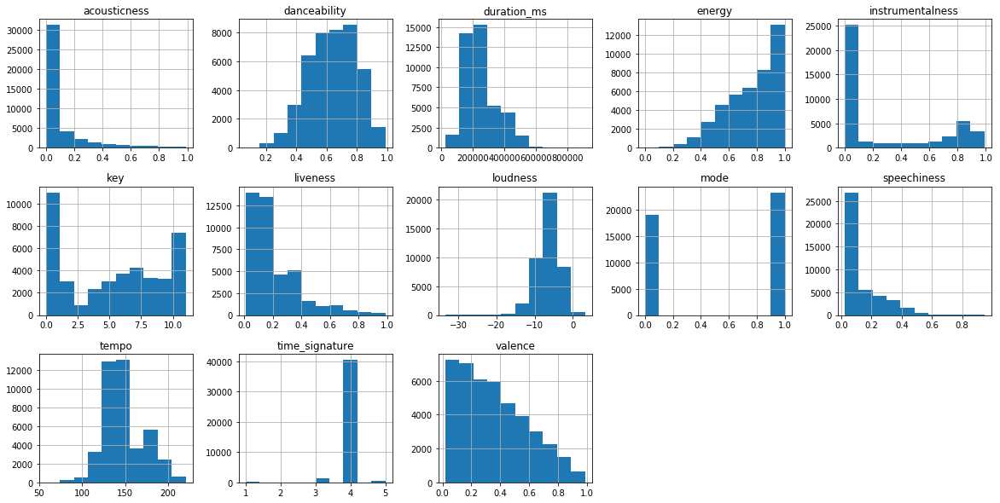

In [9]:
#histogram of numerical columns in the dataset
num_hist = numeric.hist(layout=(3,5),figsize=(20,10))
plt.show()

In [10]:
#Identifying no of unique genre
np.unique(genre)

array(['Dark Trap', 'Emo', 'Hiphop', 'Pop', 'Rap', 'RnB', 'Trap Metal',
       'Underground Rap', 'dnb', 'hardstyle', 'psytrance', 'techhouse',
       'techno', 'trance', 'trap'], dtype=object)

#Features of Each Genre

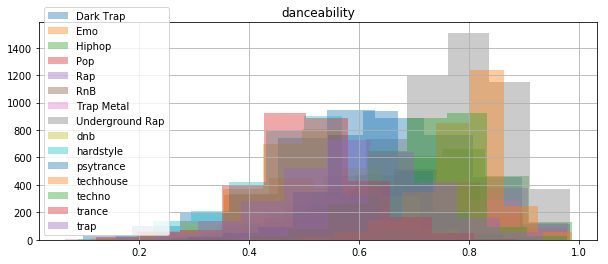

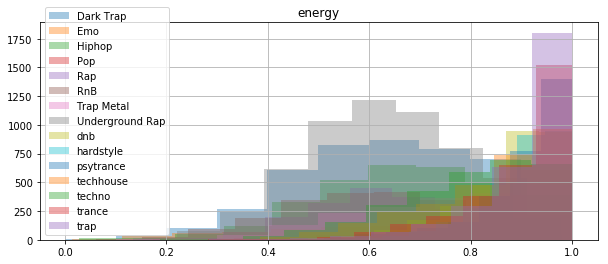

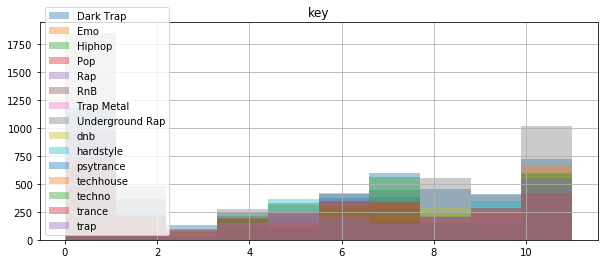

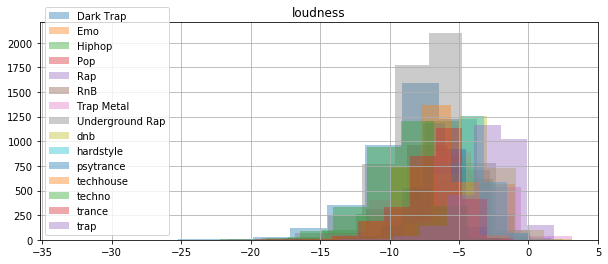

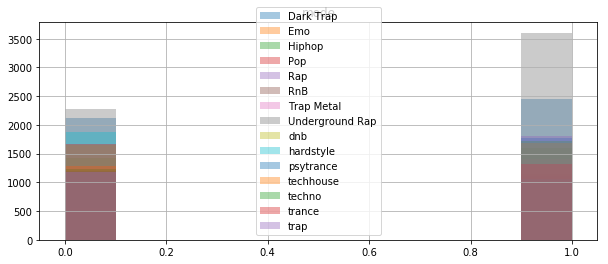

...

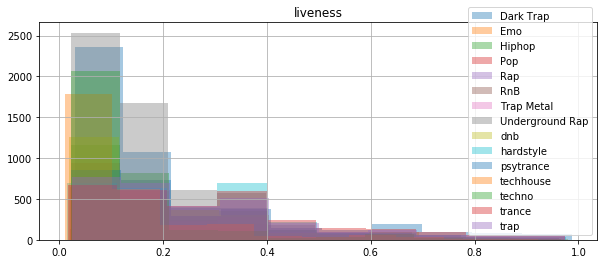

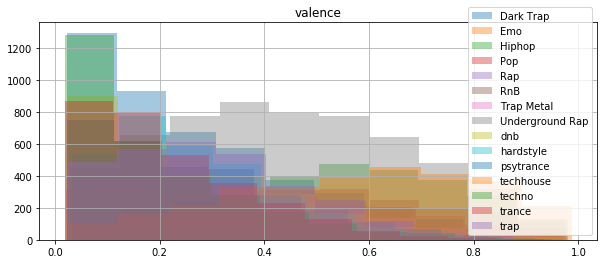

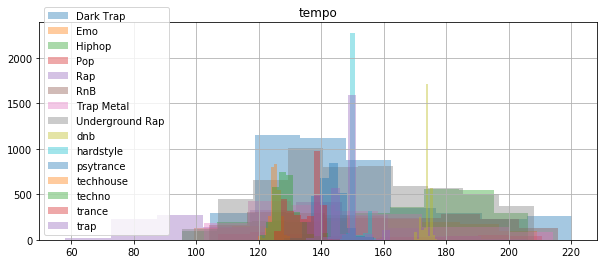

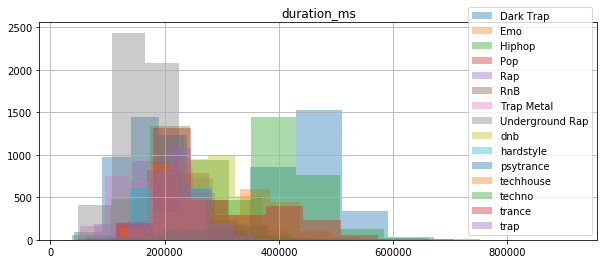

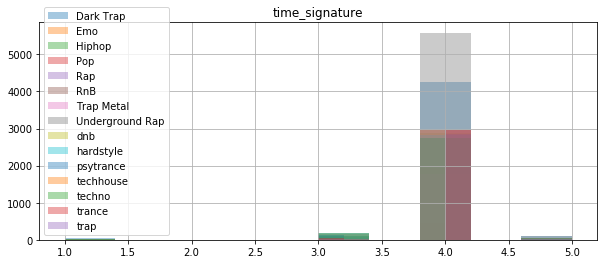

In [11]:
grouped_genre = data.groupby('genre')

for col in numeric.columns:
    fig,ax = plt.subplots()
    
    for i, d in grouped_genre:
        d[col].hist(alpha=0.4, ax=ax, label=i,figsize=(10,4))
        ax.set_title(col)

    ax.legend()
    plt.show()

In [12]:
#Mean of different features in a Genre
grouped_genre.mean()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
genre,,,,,,,,,,,,,
Dark Trap,0.618834,0.646851,5.298384,-7.998401,0.536479,0.123434,0.159493,0.277276,0.185081,0.273663,149.791186,187707.330275,3.961337
Emo,0.493699,0.761175,5.052976,-5.433641,0.685714,0.080325,0.143094,0.011402,0.195243,0.444145,153.888640,218317.432143,3.938690
Hiphop,0.698982,0.654418,5.553170,-7.014983,0.527741,0.217150,0.195569,0.017154,0.210581,0.523628,162.980479,227954.272787,3.975561
Pop,0.676807,0.697638,5.399132,-5.632072,0.548807,0.088363,0.149251,0.013831,0.177949,0.550264,152.098937,211392.828633,3.984816
Rap,0.742877,0.620083,5.048701,-6.887086,0.522186,0.217862,0.170566,0.006939,0.181320,0.440921,126.006374,203007.674784,3.985931
RnB,0.674206,0.598884,5.021915,-6.899896,0.532158,0.143110,0.225276,0.007400,0.178984,0.493974,157.533793,226402.473559,3.960934
Trap Metal,0.647564,0.749157,4.663088,-5.879087,0.717791,0.209677,0.114926,0.057051,0.243655,0.348786,148.684947,147195.234151,3.953476
Underground Rap,0.744658,0.635776,5.059064,-7.362036,0.613617,0.224992,0.162708,0.025280,0.191116,0.444629,152.914521,176152.595234,3.979915
dnb,0.520944,0.873433,5.619016,-4.063237,0.446055,0.083478,0.019543,0.459998,0.202883,0.253062,173.849166,286548.825017,3.998314


In [13]:
#Standard deviation of different features in a Genre
grouped_genre.std()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
genre,,,,,,,,,,,,,
Dark Trap,0.161002,0.180810,3.638048,3.156933,0.498722,0.123217,0.214746,0.366365,0.144774,0.206191,27.201544,60377.140798,0.368688
Emo,0.126014,0.220404,3.477168,2.598227,0.464369,0.075109,0.260326,0.077927,0.145681,0.202451,27.545931,43426.023963,0.318840
Hiphop,0.142183,0.162416,3.679533,2.827193,0.499312,0.131501,0.219940,0.093075,0.162457,0.222957,28.188804,60884.353006,0.329274
Pop,0.119175,0.155379,3.644698,1.947846,0.498153,0.081074,0.198390,0.085986,0.140379,0.215627,32.360009,35368.133282,0.250624
Rap,0.127670,0.137444,3.705862,2.353116,0.499643,0.134830,0.178520,0.058052,0.132247,0.215302,29.106285,59281.310692,0.284631
RnB,0.140207,0.164788,3.638515,2.518220,0.499084,0.112993,0.231904,0.060419,0.133160,0.221235,29.820987,50866.054759,0.361912
Trap Metal,0.169564,0.174147,3.748826,3.038965,0.450189,0.159220,0.166583,0.177845,0.186634,0.215788,26.672863,45075.031628,0.343568
Underground Rap,0.128180,0.155994,3.777848,2.755624,0.486962,0.144794,0.186051,0.116380,0.148016,0.224521,26.671957,54752.469716,0.283957
dnb,0.106605,0.097925,3.589637,1.946063,0.497165,0.076611,0.051514,0.359274,0.167220,0.185296,1.141970,51728.231272,0.066194


In [14]:
#Min values of different features in a Genre
grouped_genre.min()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
genre,,,,,,,,,,,,,
Dark Trap,0.0979,0.000243,0,-25.222,0,0.0242,0.000001,0.000000,0.0307,0.0235,75.418,42133,1
Emo,0.1110,0.014800,0,-32.929,0,0.0232,0.000001,0.000000,0.0210,0.0358,87.018,50720,1
Hiphop,0.1970,0.027900,0,-24.694,0,0.0227,0.000017,0.000000,0.0219,0.0352,95.622,38333,1
Pop,0.2090,0.173000,0,-16.423,0,0.0232,0.000068,0.000000,0.0215,0.0383,106.960,121143,1
Rap,0.2410,0.144000,0,-19.720,0,0.0271,0.000151,0.000000,0.0221,0.0362,57.967,77500,1
RnB,0.1910,0.060900,0,-29.478,0,0.0239,0.000081,0.000000,0.0235,0.0338,91.560,62213,1
Trap Metal,0.0651,0.000243,0,-33.357,0,0.0242,0.000001,0.000000,0.0221,0.0206,74.716,52963,1
Underground Rap,0.2410,0.134000,0,-21.657,0,0.0251,0.000018,0.000000,0.0221,0.0294,95.622,49227,1
dnb,0.1380,0.349000,0,-17.088,0,0.0265,0.000003,0.000000,0.0189,0.0253,169.857,35862,1


In [15]:
#Max values of different features in a Genre
grouped_genre.max()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
genre,,,,,,,,,,,,,
Dark Trap,0.985,0.998,11,1.646,1,0.946,0.984,0.989,0.958,0.968,220.290,534857,5
Emo,0.926,0.995,11,-0.946,1,0.729,0.988,0.952,0.943,0.971,208.951,548253,5
Hiphop,0.988,0.978,11,-0.067,1,0.944,0.982,0.947,0.973,0.975,206.247,723573,5
Pop,0.935,0.977,11,-2.058,1,0.463,0.948,0.947,0.790,0.966,210.796,484147,5
Rap,0.981,0.980,11,-1.181,1,0.833,0.883,0.951,0.892,0.970,205.895,728413,5
RnB,0.978,0.974,11,0.175,1,0.786,0.986,0.939,0.965,0.979,215.669,602297,5
Trap Metal,0.985,0.999,11,3.148,1,0.908,0.986,0.963,0.962,0.976,214.034,474157,5
Underground Rap,0.985,0.997,11,2.499,1,0.914,0.947,0.964,0.962,0.980,207.982,636213,5
dnb,0.855,0.999,11,3.108,1,0.906,0.783,0.968,0.981,0.970,177.100,514629,5


In [16]:
#Songs count for all the genre's
genre_count = {}
for gen in np.unique(genre):
    genre_count[gen] = len(data[data['genre'] == gen])
genre_count

{'Dark Trap': 4578,
 'Emo': 1680,
 'Hiphop': 3028,
 'Pop': 461,
 'Rap': 1848,
 'RnB': 2099,
 'Trap Metal': 1956,
 'Underground Rap': 5875,
 'dnb': 2966,
 'hardstyle': 2936,
 'psytrance': 2961,
 'techhouse': 2975,
 'techno': 2956,
 'trance': 2999,
 'trap': 2987}

In [17]:
data['genre'].value_counts()

Underground Rap    5875
Dark Trap          4578
Hiphop             3028
trance             2999
trap               2987
techhouse          2975
dnb                2966
psytrance          2961
techno             2956
hardstyle          2936
RnB                2099
Trap Metal         1956
Rap                1848
Emo                1680
Pop                 461
Name: genre, dtype: int64

In [1]:
org_genre=data['genre']

NameError: name 'data' is not defined

In [2]:
fig = plt.figure(figsize=(20,10))
plt.bar(height=data['genre'].value_counts().values,x=data['genre'].value_counts().index)
plt.show()


NameError: name 'plt' is not defined

from the above bar graph it is clear that data isa bit imbalanced as there are less 
no.of pop songs and more no of underground and RapDark Trap

## Correlation Analysis

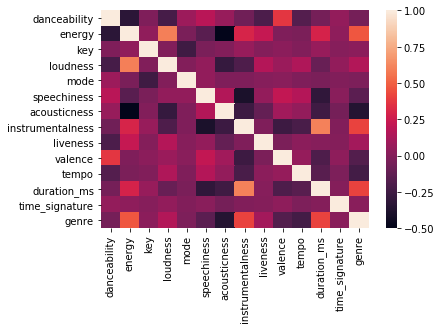

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder,OneHotEncoder,StandardScaler
from imblearn.over_sampling import SMOTE
import seaborn as sns
import joblib

data['genre'] = LabelEncoder().fit_transform(data['genre'])
corr = data.corr()
sns.heatmap(data=corr)

In [21]:
corr['genre']

danceability       -0.052687
energy              0.471327
key                 0.027398
loudness            0.160771
mode               -0.019531
speechiness        -0.144596
acousticness       -0.356286
instrumentalness    0.414434
liveness            0.107690
valence            -0.170698
tempo              -0.231731
duration_ms         0.412508
time_signature      0.019943
genre               1.000000
Name: genre, dtype: float64

#Finally selecting the most important features based on correlation

In [22]:
features = data.drop(['key','mode','time_signature','danceability','genre'],axis=1)
features

,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,0.814,-7.364,0.4200,0.059800,0.013400,0.0556,0.3890,156.985,124539
1,0.493,-7.230,0.0794,0.401000,0.000000,0.1180,0.1240,115.080,224427
2,0.893,-4.783,0.0623,0.013800,0.000004,0.3720,0.0391,218.050,98821
3,0.781,-4.710,0.1030,0.023700,0.000000,0.1140,0.1750,186.948,123661
4,0.624,-7.668,0.2930,0.217000,0.000000,0.1660,0.5910,147.988,123298
5,0.568,-11.295,0.4140,0.045200,0.212000,0.1280,0.1090,144.915,112511
6,0.668,-4.162,0.1370,0.025400,0.007800,0.1240,0.0380,130.826,77584
7,0.711,-5.525,0.2210,0.039700,0.000000,0.1120,0.2830,138.049,127524
8,0.751,-2.445,0.1980,0.061400,0.000000,0.0728,0.1890,219.960,140326
9,0.907,-10.406,0.3670,0.152000,0.031100,0.5580,0.3020,199.942,121979


In [45]:
from IPython.display import display
pd.set_option('display.max_rows', 42304)
display(org_genre)

0              Dark Trap
1              Dark Trap
2              Dark Trap
3              Dark Trap
4              Dark Trap
5              Dark Trap
6              Dark Trap
7              Dark Trap
8              Dark Trap
9              Dark Trap
10             Dark Trap
11             Dark Trap
12             Dark Trap
13             Dark Trap
14             Dark Trap
15             Dark Trap
16             Dark Trap
17             Dark Trap
18             Dark Trap
19             Dark Trap
20             Dark Trap
21             Dark Trap
22             Dark Trap
23             Dark Trap
24             Dark Trap
25             Dark Trap
26             Dark Trap
27             Dark Trap
28             Dark Trap
29             Dark Trap
30             Dark Trap
31             Dark Trap
32             Dark Trap
33             Dark Trap
34             Dark Trap
35             Dark Trap
36             Dark Trap
37             Dark Trap
38             Dark Trap
39             Dark Trap


In [24]:
labels = data['genre']
#applying feature scaling
sc= StandardScaler()
features= sc.fit_transform(features)
joblib.dump(sc,"transform.save")
#To handle imbalance in dataset performing oversampling
oversample = SMOTE()
features, labels = oversample.fit_resample(features, labels)
#Seperating train(80%) and test data(20%)
xtrain,xtest,ytrain,ytest = train_test_split(features,labels,test_size=0.2,shuffle=True)

In [25]:
features.shape

(88125, 9)

In [59]:
data['genre'].iloc[36654]

8

In [27]:
xtrain.shape

(70500, 9)

# Using BaggingClassifier to build the model

In [28]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import BaggingClassifier

model = BaggingClassifier()

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(model, xtrain, ytrain, scoring='accuracy',\
                           cv=cv, n_jobs=-1, error_score='raise')

In [29]:
n_scores

array([0.7670922 , 0.75843972, 0.7587234 , 0.75475177, 0.75787234,
       0.76156028, 0.7564539 , 0.7529078 , 0.75815603, 0.75716312,
       0.75730496, 0.76028369, 0.76      , 0.75588652, 0.75929078,
       0.75432624, 0.75602837, 0.75531915, 0.75730496, 0.75943262,
       0.76893617, 0.76042553, 0.74836879, 0.75900709, 0.75191489,
       0.75801418, 0.74822695, 0.75716312, 0.76056738, 0.75758865])

In [30]:
#Average cro
n_scores.mean()

0.7576170212765956

In [31]:
model = BaggingClassifier()
model.fit(xtrain,ytrain)
pred = model.predict(xtest)
pred

array([12,  7,  2, ...,  6, 13,  2])

In [32]:
#Accuracy of the model
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix
accuracy_score(ytest,pred)

0.7619858156028368

In [33]:
f1_score(ytest,pred,average='weighted')

0.7586141943987172

In [34]:
joblib.dump(model,"bagging.model")

['bagging.model']

In [60]:
xtest[1563]

array([-0.59393044, -0.63521573, -0.56599026, -0.50373754,  1.17381376,
       -0.84628224,  0.53303376, -0.94333361, -0.42939038])

In [61]:
ytest[1563]

0